# ESM-BLSTM
---
## Predicted vs Measured
### Extracting the values

In [ ]:
import os
import sys
import pandas as pd
import torch
from torch import nn
from torch.utils.data import Dataset
from torch.utils.data import DataLoader as TorchDataLoader
from torch_geometric.loader import DataLoader as GeometricDataLoader

import lightning as L

from transformers import EsmTokenizer, EsmModel

class DmsDataset(Dataset):
    def __init__(self, csv_file:str, binding_or_expression:str):
        """
        Load from csv file into pandas:
        - sequence label ('labels'), 
        - 'sequence',
        - binding or expression target ('binding_or_expression')
        """
        try:
            self.full_df = pd.read_csv(csv_file, sep=',', header=0)
            self.target = 'ACE2-binding_affinity' if 'binding' in binding_or_expression else 'RBD_expression'
        except (FileNotFoundError, pd.errors.ParserError, Exception) as e:
            print(f"Error reading in .csv file: {csv_file}\n{e}", file=sys.stderr)
            sys.exit(1)

    def __len__(self) -> int:
        return len(self.full_df)

    def __getitem__(self, idx):
        # label, seq, target
        return self.full_df['label'][idx], self.full_df['sequence'][idx], self.full_df[self.target][idx]

class DmsDataModule(L.LightningDataModule):
    def __init__(self, data_dir: str, binding_or_expression:str, torch_geometric_tag: bool, batch_size: int, num_workers: int, seed: int):
        super().__init__()
        self.data_dir = data_dir
        self.binding_or_expression = binding_or_expression
        self.torch_geometric_tag = torch_geometric_tag
        self.batch_size = batch_size
        self.num_workers = num_workers
        self.seed = seed

        # Set seeds globally for reproducibility
        L.seed_everything(self.seed, workers=True)

    def setup(self, stage):
        # Called on every GPU
        if stage == 'fit':
            self.train_dataset = DmsDataset(os.path.join(self.data_dir, "mutation_combined_DMS_OLD_train.csv"), self.binding_or_expression)
            self.val_dataset = DmsDataset(os.path.join(self.data_dir, "mutation_combined_DMS_OLD_test.csv"), self.binding_or_expression)

    def train_dataloader(self):
        loader = GeometricDataLoader if self.torch_geometric_tag else TorchDataLoader

        return loader(
            self.train_dataset, 
            batch_size=self.batch_size, 
            shuffle=True, 
            num_workers=self.num_workers,
            generator=torch.Generator().manual_seed(self.seed),
            pin_memory=True
        )
        
    def val_dataloader(self):
        loader = GeometricDataLoader if self.torch_geometric_tag else TorchDataLoader

        return loader(
            self.val_dataset, 
            batch_size=self.batch_size, 
            shuffle=False, 
            num_workers=self.num_workers,
            generator=torch.Generator().manual_seed(self.seed),
            pin_memory=True
        )

class BLSTM(L.LightningModule):
    """ Bidirectional LSTM. Output is embedding layer, not prediction value."""

    def __init__(self,
                 lstm_input_size,    # The number of expected features.
                 lstm_hidden_size,   # The number of features in hidden state h.
                 lstm_num_layers,    # Number of recurrent layers in LSTM.
                 lstm_bidirectional, # Bidrectional LSTM.
                 fcn_hidden_size,    # The number of features in hidden layer of CN.
                 fcn_num_layers):    # The number of fcn layers
        super().__init__()

        # LSTM layer
        self.lstm = nn.LSTM(input_size=lstm_input_size,
                            hidden_size=lstm_hidden_size,
                            num_layers=lstm_num_layers,
                            bidirectional=lstm_bidirectional,
                            batch_first=True)           

        # FCN layer(s)
        layers = []
        input_size = 2 * lstm_hidden_size if lstm_bidirectional else lstm_hidden_size

        for _ in range(fcn_num_layers):
            layers.append(nn.Linear(input_size, fcn_hidden_size))
            layers.append(nn.ReLU())
            input_size = fcn_hidden_size

        self.fcn = nn.Sequential(*layers)

        # FCN output layer
        self.out = nn.Linear(fcn_hidden_size, 1)

    def forward(self, x):
        if x.dim() == 2:
            x = x.unsqueeze(1)  # Add a sequence length dimension of 1, now [batch_size, sequence_length, features]

        num_directions = 2 if self.lstm.bidirectional else 1
        h_0 = torch.zeros(num_directions * self.lstm.num_layers, x.size(0), self.lstm.hidden_size, device=x.device)
        c_0 = torch.zeros(num_directions * self.lstm.num_layers, x.size(0), self.lstm.hidden_size, device=x.device)

        lstm_out, (h_n, c_n) = self.lstm(x, (h_0, c_0))
        lstm_final_out = lstm_out[:, -1, :]
        fcn_out = self.fcn(lstm_final_out)
        prediction = self.out(fcn_out).squeeze(1)  # [batch_size]
        return prediction

class LightningEsmBlstm(L.LightningModule):
    def __init__(self, 
                 script_letter:str, binding_or_expression:str,
                 lr: float, max_len: int, blstm_model: BLSTM, esm_version="facebook/esm2_t6_8M_UR50D", from_saved=None):
        super().__init__()
        self.script_letter = script_letter
        self.binding_or_expression = binding_or_expression
        self.tokenizer = EsmTokenizer.from_pretrained(esm_version, cache_dir="../../../.cache")
        self.esm = EsmModel.from_pretrained(esm_version, cache_dir="../../../.cache")
        self.blstm = blstm_model
        self.lr = lr
        self.max_len = max_len
        self.batch_dataframes = []

        # Load fine-tuned weights 
        if from_saved is not None:
            if trainer.global_rank == 0: print(f"Loading model checkpoint from {from_saved}...")

            ckpt = torch.load(from_saved, map_location="cpu")
            state_dict = ckpt["state_dict"]
            self.load_state_dict(state_dict, strict=True)

    def forward(self, input_ids, attention_mask):
        esm_last_hidden_state = self.esm(input_ids=input_ids, attention_mask=attention_mask).last_hidden_state # shape: [batch_size, sequence_length, embedding_dim]
        esm_aa_embedding = esm_last_hidden_state[:, 1:-1, :] # Amino Acid-level representations, [batch_size, sequence_length-2, embedding_dim], excludes 1st and last tokens
        return self.blstm(esm_aa_embedding) # [batch_size]
    
    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=self.lr)

    def training_step(self, batch, batch_idx):
        seq_ids, seqs, targets = batch
        targets = targets.to(self.device).float()
        batch_size = targets.size(0)

        tokenized = self.tokenizer(seqs, return_tensors="pt", padding=True, truncation=True, max_length=self.max_len)
        tokenized = {k: v.to(self.device) for k, v in tokenized.items()}

        preds = self(input_ids=tokenized["input_ids"], attention_mask=tokenized["attention_mask"])

        # Create a DataFrame for the batch
        batch_df = pd.DataFrame({
            "seq_id": seq_ids,
            "measured_value": [target.item() for target in targets],
            "predicted_value": [pred.item() for pred in preds],
            "mode": ["train"] * batch_size
        })

        self.batch_dataframes.append(batch_df)

    def validation_step(self, batch, batch_idx):
        seq_ids, seqs, targets = batch
        targets = targets.to(self.device).float()
        batch_size = targets.size(0)

        tokenized = self.tokenizer(seqs, return_tensors="pt", padding=True, truncation=True, max_length=self.max_len)
        tokenized = {k: v.to(self.device) for k, v in tokenized.items()}

        preds = self(input_ids=tokenized["input_ids"], attention_mask=tokenized["attention_mask"])

        # Create a DataFrame for the batch
        batch_df = pd.DataFrame({
            "seq_id": seq_ids,
            "measured_value": [target.item() for target in targets],
            "predicted_value": [pred.item() for pred in preds],
            "mode": ["test"] * batch_size
        })

        self.batch_dataframes.append(batch_df)

    def on_fit_end(self):
        # Concatenate all batch DataFrames into one and save
        result_df = pd.concat(self.batch_dataframes, ignore_index=True)
        result_df.to_csv(f"scatter/esm_blstm/esm_blstm.{self.script_letter}.{self.binding_or_expression}-predicted_vs_measured.values.csv", index=False)
        print("Saved prediction vs measured values.")

A

In [128]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# BLSTM input, size should match used ESM model embedding_dim size
size = 320
lstm_input_size = size
lstm_hidden_size = size
lstm_num_layers = 1        
lstm_bidrectional = True   
fcn_hidden_size = size
fcn_num_layers = 5
blstm = BLSTM(lstm_input_size, lstm_hidden_size, lstm_num_layers, lstm_bidrectional, fcn_hidden_size, fcn_num_layers)

# Initialize DataModule and model
script_letter = "A"
binding_or_expression = "binding"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=False, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmBlstm(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-4,
    max_len=280,
    blstm_model=blstm,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21837252/ckpt/best_model-epoch=822.val_rmse=0.5685.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21837252/ckpt/best_model-epoch=822.val_rmse=0.5685.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name  | Type     | Params | Mode 
-------------------------------------------
0 | esm   | EsmModel | 7.8 M  | eval 
1 | blstm | BLSTM    | 2.3 M  | train
-------------------------------------------
10.1 M    Trainable params
0         Non-trainable params
10.1 M    Total params
40.400    Total estimated model params size (MB)
14        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:14<00:00,  9.56it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:14<00:00,  9.56it/s]
Saved prediction vs measured values.


In [129]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# BLSTM input, size should match used ESM model embedding_dim size
size = 320
lstm_input_size = size
lstm_hidden_size = size
lstm_num_layers = 1        
lstm_bidrectional = True   
fcn_hidden_size = size
fcn_num_layers = 5
blstm = BLSTM(lstm_input_size, lstm_hidden_size, lstm_num_layers, lstm_bidrectional, fcn_hidden_size, fcn_num_layers)

# Initialize DataModule and model
script_letter = "A"
binding_or_expression = "expression"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=False, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmBlstm(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-4,
    max_len=280,
    blstm_model=blstm,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21774790/ckpt/best_model-epoch=687.val_rmse=0.3497.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21774790/ckpt/best_model-epoch=687.val_rmse=0.3497.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name  | Type     | Params | Mode 
-------------------------------------------
0 | esm   | EsmModel | 7.8 M  | eval 
1 | blstm | BLSTM    | 2.3 M  | train
-------------------------------------------
10.1 M    Trainable params
0         Non-trainable params
10.1 M    Total params
40.400    Total estimated model params size (MB)
14        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:14<00:00,  9.56it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:14<00:00,  9.56it/s]
Saved prediction vs measured values.


B

In [130]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# BLSTM input, size should match used ESM model embedding_dim size
size = 320
lstm_input_size = size
lstm_hidden_size = size
lstm_num_layers = 1        
lstm_bidrectional = True   
fcn_hidden_size = size
fcn_num_layers = 5
blstm = BLSTM(lstm_input_size, lstm_hidden_size, lstm_num_layers, lstm_bidrectional, fcn_hidden_size, fcn_num_layers)

# Initialize DataModule and model
script_letter = "B"
binding_or_expression = "binding"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=False, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmBlstm(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-5,
    max_len=280,
    blstm_model=blstm,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21774792/ckpt/best_model-epoch=994.val_rmse=0.8058.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21774792/ckpt/best_model-epoch=994.val_rmse=0.8058.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name  | Type     | Params | Mode 
-------------------------------------------
0 | esm   | EsmModel | 7.8 M  | eval 
1 | blstm | BLSTM    | 2.3 M  | train
-------------------------------------------
10.1 M    Trainable params
0         Non-trainable params
10.1 M    Total params
40.400    Total estimated model params size (MB)
14        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:06<00:00, 10.14it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:06<00:00, 10.14it/s]
Saved prediction vs measured values.


In [131]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# BLSTM input, size should match used ESM model embedding_dim size
size = 320
lstm_input_size = size
lstm_hidden_size = size
lstm_num_layers = 1        
lstm_bidrectional = True   
fcn_hidden_size = size
fcn_num_layers = 5
blstm = BLSTM(lstm_input_size, lstm_hidden_size, lstm_num_layers, lstm_bidrectional, fcn_hidden_size, fcn_num_layers)

# Initialize DataModule and model
script_letter = "B"
binding_or_expression = "expression"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=False, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmBlstm(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-5,
    max_len=280,
    blstm_model=blstm,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21774791/ckpt/best_model-epoch=999.val_rmse=0.4444.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21774791/ckpt/best_model-epoch=999.val_rmse=0.4444.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name  | Type     | Params | Mode 
-------------------------------------------
0 | esm   | EsmModel | 7.8 M  | eval 
1 | blstm | BLSTM    | 2.3 M  | train
-------------------------------------------
10.1 M    Trainable params
0         Non-trainable params
10.1 M    Total params
40.400    Total estimated model params size (MB)
14        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:17<00:00,  9.36it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:17<00:00,  9.36it/s]
Saved prediction vs measured values.


C

In [132]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# BLSTM input, size should match used ESM model embedding_dim size
size = 320
lstm_input_size = size
lstm_hidden_size = size
lstm_num_layers = 1        
lstm_bidrectional = True   
fcn_hidden_size = size
fcn_num_layers = 5
blstm = BLSTM(lstm_input_size, lstm_hidden_size, lstm_num_layers, lstm_bidrectional, fcn_hidden_size, fcn_num_layers)

# Initialize DataModule and model
script_letter = "C"
binding_or_expression = "binding"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=False, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmBlstm(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-4,
    max_len=280,
    blstm_model=blstm,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21774793/ckpt/best_model-epoch=456.val_rmse=0.5341.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21774793/ckpt/best_model-epoch=456.val_rmse=0.5341.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name  | Type     | Params | Mode 
-------------------------------------------
0 | esm   | EsmModel | 7.8 M  | eval 
1 | blstm | BLSTM    | 2.3 M  | train
-------------------------------------------
10.1 M    Trainable params
0         Non-trainable params
10.1 M    Total params
40.400    Total estimated model params size (MB)
14        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:12<00:00,  9.71it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:12<00:00,  9.70it/s]
Saved prediction vs measured values.


In [133]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# BLSTM input, size should match used ESM model embedding_dim size
size = 320
lstm_input_size = size
lstm_hidden_size = size
lstm_num_layers = 1        
lstm_bidrectional = True   
fcn_hidden_size = size
fcn_num_layers = 5
blstm = BLSTM(lstm_input_size, lstm_hidden_size, lstm_num_layers, lstm_bidrectional, fcn_hidden_size, fcn_num_layers)

# Initialize DataModule and model
script_letter = "C"
binding_or_expression = "expression"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=False, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmBlstm(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-4,
    max_len=280,
    blstm_model=blstm,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21774794/ckpt/best_model-epoch=462.val_rmse=0.3253.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21774794/ckpt/best_model-epoch=462.val_rmse=0.3253.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name  | Type     | Params | Mode 
-------------------------------------------
0 | esm   | EsmModel | 7.8 M  | eval 
1 | blstm | BLSTM    | 2.3 M  | train
-------------------------------------------
10.1 M    Trainable params
0         Non-trainable params
10.1 M    Total params
40.400    Total estimated model params size (MB)
14        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:09<00:00,  9.90it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:09<00:00,  9.90it/s]
Saved prediction vs measured values.


D

In [134]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# BLSTM input, size should match used ESM model embedding_dim size
size = 320
lstm_input_size = size
lstm_hidden_size = size
lstm_num_layers = 1        
lstm_bidrectional = True   
fcn_hidden_size = size
fcn_num_layers = 5
blstm = BLSTM(lstm_input_size, lstm_hidden_size, lstm_num_layers, lstm_bidrectional, fcn_hidden_size, fcn_num_layers)

# Initialize DataModule and model
script_letter = "D"
binding_or_expression = "binding"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=False, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmBlstm(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-4,
    max_len=280,
    blstm_model=blstm,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21774795/ckpt/best_model-epoch=992.val_rmse=0.5626.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21774795/ckpt/best_model-epoch=992.val_rmse=0.5626.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name  | Type     | Params | Mode 
-------------------------------------------
0 | esm   | EsmModel | 7.8 M  | eval 
1 | blstm | BLSTM    | 2.3 M  | train
-------------------------------------------
10.1 M    Trainable params
0         Non-trainable params
10.1 M    Total params
40.400    Total estimated model params size (MB)
14        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:18<00:00,  9.27it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:18<00:00,  9.27it/s]
Saved prediction vs measured values.


In [135]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# BLSTM input, size should match used ESM model embedding_dim size
size = 320
lstm_input_size = size
lstm_hidden_size = size
lstm_num_layers = 1        
lstm_bidrectional = True   
fcn_hidden_size = size
fcn_num_layers = 5
blstm = BLSTM(lstm_input_size, lstm_hidden_size, lstm_num_layers, lstm_bidrectional, fcn_hidden_size, fcn_num_layers)

# Initialize DataModule and model
script_letter = "D"
binding_or_expression = "expression"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=False, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmBlstm(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-4,
    max_len=280,
    blstm_model=blstm,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21774796/ckpt/best_model-epoch=131.val_rmse=0.3238.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21774796/ckpt/best_model-epoch=131.val_rmse=0.3238.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name  | Type     | Params | Mode 
-------------------------------------------
0 | esm   | EsmModel | 7.8 M  | eval 
1 | blstm | BLSTM    | 2.3 M  | train
-------------------------------------------
10.1 M    Trainable params
0         Non-trainable params
10.1 M    Total params
40.400    Total estimated model params size (MB)
14        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:12<00:00,  9.72it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:12<00:00,  9.72it/s]
Saved prediction vs measured values.


E

In [136]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# BLSTM input, size should match used ESM model embedding_dim size
size = 320
lstm_input_size = size
lstm_hidden_size = size
lstm_num_layers = 1        
lstm_bidrectional = True   
fcn_hidden_size = size
fcn_num_layers = 5
blstm = BLSTM(lstm_input_size, lstm_hidden_size, lstm_num_layers, lstm_bidrectional, fcn_hidden_size, fcn_num_layers)

# Initialize DataModule and model
script_letter = "E"
binding_or_expression = "binding"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=False, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmBlstm(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-4,
    max_len=280,
    blstm_model=blstm,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21837253/ckpt/best_model-epoch=857.val_rmse=0.5224.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21837253/ckpt/best_model-epoch=857.val_rmse=0.5224.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name  | Type     | Params | Mode 
-------------------------------------------
0 | esm   | EsmModel | 7.8 M  | eval 
1 | blstm | BLSTM    | 2.3 M  | train
-------------------------------------------
10.1 M    Trainable params
0         Non-trainable params
10.1 M    Total params
40.400    Total estimated model params size (MB)
14        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:10<00:00,  9.83it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:10<00:00,  9.83it/s]
Saved prediction vs measured values.


In [137]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# BLSTM input, size should match used ESM model embedding_dim size
size = 320
lstm_input_size = size
lstm_hidden_size = size
lstm_num_layers = 1        
lstm_bidrectional = True   
fcn_hidden_size = size
fcn_num_layers = 5
blstm = BLSTM(lstm_input_size, lstm_hidden_size, lstm_num_layers, lstm_bidrectional, fcn_hidden_size, fcn_num_layers)

# Initialize DataModule and model
script_letter = "E"
binding_or_expression = "expression"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=False, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmBlstm(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-4,
    max_len=280,
    blstm_model=blstm,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21837254/ckpt/best_model-epoch=897.val_rmse=0.3135.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21837254/ckpt/best_model-epoch=897.val_rmse=0.3135.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name  | Type     | Params | Mode 
-------------------------------------------
0 | esm   | EsmModel | 7.8 M  | eval 
1 | blstm | BLSTM    | 2.3 M  | train
-------------------------------------------
10.1 M    Trainable params
0         Non-trainable params
10.1 M    Total params
40.400    Total estimated model params size (MB)
14        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:18<00:00,  9.27it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:18<00:00,  9.27it/s]
Saved prediction vs measured values.


F

In [138]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# BLSTM input, size should match used ESM model embedding_dim size
size = 320
lstm_input_size = size
lstm_hidden_size = size
lstm_num_layers = 1        
lstm_bidrectional = True   
fcn_hidden_size = size
fcn_num_layers = 5
blstm = BLSTM(lstm_input_size, lstm_hidden_size, lstm_num_layers, lstm_bidrectional, fcn_hidden_size, fcn_num_layers)

# Initialize DataModule and model
script_letter = "F"
binding_or_expression = "binding"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=False, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmBlstm(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-5,
    max_len=280,
    blstm_model=blstm,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21837255/ckpt/best_model-epoch=989.val_rmse=0.6631.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21837255/ckpt/best_model-epoch=989.val_rmse=0.6631.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name  | Type     | Params | Mode 
-------------------------------------------
0 | esm   | EsmModel | 7.8 M  | eval 
1 | blstm | BLSTM    | 2.3 M  | train
-------------------------------------------
10.1 M    Trainable params
0         Non-trainable params
10.1 M    Total params
40.400    Total estimated model params size (MB)
14        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:11<00:00,  9.74it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:11<00:00,  9.74it/s]
Saved prediction vs measured values.


In [139]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# BLSTM input, size should match used ESM model embedding_dim size
size = 320
lstm_input_size = size
lstm_hidden_size = size
lstm_num_layers = 1        
lstm_bidrectional = True   
fcn_hidden_size = size
fcn_num_layers = 5
blstm = BLSTM(lstm_input_size, lstm_hidden_size, lstm_num_layers, lstm_bidrectional, fcn_hidden_size, fcn_num_layers)

# Initialize DataModule and model
script_letter = "F"
binding_or_expression = "expression"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=False, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmBlstm(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-5,
    max_len=280,
    blstm_model=blstm,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21837256/ckpt/best_model-epoch=992.val_rmse=0.4131.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21837256/ckpt/best_model-epoch=992.val_rmse=0.4131.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name  | Type     | Params | Mode 
-------------------------------------------
0 | esm   | EsmModel | 7.8 M  | eval 
1 | blstm | BLSTM    | 2.3 M  | train
-------------------------------------------
10.1 M    Trainable params
0         Non-trainable params
10.1 M    Total params
40.400    Total estimated model params size (MB)
14        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:13<00:00,  9.60it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:13<00:00,  9.60it/s]
Saved prediction vs measured values.


G

In [140]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# BLSTM input, size should match used ESM model embedding_dim size
size = 320
lstm_input_size = size
lstm_hidden_size = size
lstm_num_layers = 1        
lstm_bidrectional = True   
fcn_hidden_size = size
fcn_num_layers = 5
blstm = BLSTM(lstm_input_size, lstm_hidden_size, lstm_num_layers, lstm_bidrectional, fcn_hidden_size, fcn_num_layers)

# Initialize DataModule and model
script_letter = "G"
binding_or_expression = "binding"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=False, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmBlstm(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-4,
    max_len=280,
    blstm_model=blstm,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21837257/ckpt/best_model-epoch=301.val_rmse=0.5281.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21837257/ckpt/best_model-epoch=301.val_rmse=0.5281.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name  | Type     | Params | Mode 
-------------------------------------------
0 | esm   | EsmModel | 7.8 M  | eval 
1 | blstm | BLSTM    | 2.3 M  | train
-------------------------------------------
10.1 M    Trainable params
0         Non-trainable params
10.1 M    Total params
40.400    Total estimated model params size (MB)
14        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:18<00:00,  9.29it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:18<00:00,  9.29it/s]
Saved prediction vs measured values.


In [141]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# BLSTM input, size should match used ESM model embedding_dim size
size = 320
lstm_input_size = size
lstm_hidden_size = size
lstm_num_layers = 1        
lstm_bidrectional = True   
fcn_hidden_size = size
fcn_num_layers = 5
blstm = BLSTM(lstm_input_size, lstm_hidden_size, lstm_num_layers, lstm_bidrectional, fcn_hidden_size, fcn_num_layers)

# Initialize DataModule and model
script_letter = "G"
binding_or_expression = "expression"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=False, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmBlstm(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-4,
    max_len=280,
    blstm_model=blstm,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21837258/ckpt/best_model-epoch=852.val_rmse=0.3181.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21837258/ckpt/best_model-epoch=852.val_rmse=0.3181.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name  | Type     | Params | Mode 
-------------------------------------------
0 | esm   | EsmModel | 7.8 M  | eval 
1 | blstm | BLSTM    | 2.3 M  | train
-------------------------------------------
10.1 M    Trainable params
0         Non-trainable params
10.1 M    Total params
40.400    Total estimated model params size (MB)
14        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:07<00:00, 10.05it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:07<00:00, 10.05it/s]
Saved prediction vs measured values.


H

In [142]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# BLSTM input, size should match used ESM model embedding_dim size
size = 320
lstm_input_size = size
lstm_hidden_size = size
lstm_num_layers = 1        
lstm_bidrectional = True   
fcn_hidden_size = size
fcn_num_layers = 5
blstm = BLSTM(lstm_input_size, lstm_hidden_size, lstm_num_layers, lstm_bidrectional, fcn_hidden_size, fcn_num_layers)

# Initialize DataModule and model
script_letter = "H"
binding_or_expression = "binding"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=False, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmBlstm(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-5,
    max_len=280,
    blstm_model=blstm,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21837259/ckpt/best_model-epoch=974.val_rmse=0.5531.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21837259/ckpt/best_model-epoch=974.val_rmse=0.5531.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name  | Type     | Params | Mode 
-------------------------------------------
0 | esm   | EsmModel | 7.8 M  | eval 
1 | blstm | BLSTM    | 2.3 M  | train
-------------------------------------------
10.1 M    Trainable params
0         Non-trainable params
10.1 M    Total params
40.400    Total estimated model params size (MB)
14        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:13<00:00,  9.62it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:13<00:00,  9.62it/s]
Saved prediction vs measured values.


In [143]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# BLSTM input, size should match used ESM model embedding_dim size
size = 320
lstm_input_size = size
lstm_hidden_size = size
lstm_num_layers = 1        
lstm_bidrectional = True   
fcn_hidden_size = size
fcn_num_layers = 5
blstm = BLSTM(lstm_input_size, lstm_hidden_size, lstm_num_layers, lstm_bidrectional, fcn_hidden_size, fcn_num_layers)

# Initialize DataModule and model
script_letter = "H"
binding_or_expression = "expression"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=False, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmBlstm(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-5,
    max_len=280,
    blstm_model=blstm,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21837260/ckpt/best_model-epoch=150.val_rmse=0.3337.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_blstm/version_21837260/ckpt/best_model-epoch=150.val_rmse=0.3337.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name  | Type     | Params | Mode 
-------------------------------------------
0 | esm   | EsmModel | 7.8 M  | eval 
1 | blstm | BLSTM    | 2.3 M  | train
-------------------------------------------
10.1 M    Trainable params
0         Non-trainable params
10.1 M    Total params
40.400    Total estimated model params size (MB)
14        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:13<00:00,  9.59it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:13<00:00,  9.59it/s]
Saved prediction vs measured values.


### Extracting Wildtype Binding and Expression 
To have our comparison to the wildtype values, we need to extract the predictions. We'll find the average value for each binding and expression and plot them on the scatter plot. From this, we can get the R^2 values.

In [1]:
import os
import pandas as pd

data_dir = "../../data/dms/original"
binding_df = pd.read_csv(os.path.join(data_dir, "binding_Kds.csv"), sep=',', header=0)
binding_df = binding_df.dropna(subset=['log10Ka']).reset_index(drop=True)
wildtype_b_df = binding_df[binding_df['variant_class'].str.contains('wildtype', case=False, na=False)]
wildtype_b_df = wildtype_b_df[['target', 'variant_class', 'aa_substitutions', 'log10Ka']].copy()
wildtype_b_df['mean_log10Ka'] = wildtype_b_df.groupby('target')['log10Ka'].transform('mean')
binding_wt = wildtype_b_df['mean_log10Ka'][8] 

expression_df = pd.read_csv(os.path.join(data_dir, "expression_meanFs.csv"), sep=',', header=0)
expression_df = expression_df.dropna(subset=['ML_meanF']).reset_index(drop=True)
wildtype_e_df = expression_df[expression_df['variant_class'].str.contains('wildtype', case=False, na=False)]
wildtype_e_df = wildtype_e_df[['target', 'variant_class', 'aa_substitutions', 'ML_meanF']].copy()
wildtype_e_df['mean_ML_meanF'] = wildtype_e_df.groupby('target')['ML_meanF'].transform('mean')
expression_wt = wildtype_e_df['mean_ML_meanF'][11]

print(f"WT binding: {binding_wt}, WT expression: {expression_wt}")

WT binding: 10.792732335537766, WT expression: 10.29234282907662


### Plotting Predicted vs Measured Scatterplot

In [2]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

def plot_predicted_value_scatter_with_threshold(merged_df, binding_or_expression, title, save_path, wt_loc, threshold_percent=10):
    sns.set_style('ticks')
    sns.set_context('poster')
    plt.figure(figsize=(16, 10))
    ax = plt.gca()

    # Calculate R² for test data
    test_all_df = merged_df[merged_df['mode'] == 'test']
    r2_value = r2_score(test_all_df["measured_value"], test_all_df["predicted_value"])
    print(f"R^2: {r2_value}")

    # Calculate the threshold as 10% of measured values
    merged_df['threshold'] = merged_df["measured_value"] * (threshold_percent/100)
    merged_df['abs_diff'] = np.abs(merged_df["measured_value"] - merged_df["predicted_value"])
    
    # Separate data based on the relative threshold
    within_threshold = merged_df[merged_df['abs_diff'] <= merged_df['threshold']]
    outside_threshold = merged_df[merged_df['abs_diff'] > merged_df['threshold']]

    test_outside_df = outside_threshold[outside_threshold['mode'] == 'test']
    r2_outside_value = r2_score(test_outside_df["measured_value"], test_outside_df["predicted_value"])
    print(f"R^2 outside of threshold: {r2_outside_value}")

    test_inside_df = within_threshold[within_threshold['mode'] == 'test']
    r2_inside_value = r2_score(test_inside_df["measured_value"], test_inside_df["predicted_value"])
    print(f"R^2 inside of threshold: {r2_inside_value}")

    # Plot train and test data within threshold
    marker_size = 35

    test_df = within_threshold[within_threshold['mode'] == 'test']
    sns.scatterplot(
        x=test_df["measured_value"],
        y=test_df["predicted_value"],
        s=marker_size,
        color="tab:orange",
        edgecolor="black",
        alpha=0.5,
        ax=ax,
        label="Test =<10%"
    )

    train_df = within_threshold[within_threshold['mode'] == 'train']
    sns.scatterplot(
        x=train_df["measured_value"],
        y=train_df["predicted_value"],
        s=marker_size,
        color="tab:blue",
        edgecolor="black",
        alpha=0.5,
        ax=ax,
        label="Train =<10%"
    )

    # Plot train and test data outside threshold (greyed out)
    sns.scatterplot(
        data=outside_threshold,
        x="measured_value",
        y="predicted_value",
        s=marker_size,
        color="gray",
        edgecolor="black",
        alpha=0.5,
        ax=ax,
        label=">10%"
    )

    # Add vertical line wildtype loc
    plt.axvline(x=wt_loc, color='black', linestyle='-', linewidth=2)
    plt.text(
        wt_loc, 4.5, 'wt', 
        verticalalignment='bottom',
        horizontalalignment='center',
        )

    plt.xlim(5.25, 11.5)
    plt.ylim(5.25, 11.5)
    plt.xlabel(f"Measured {binding_or_expression}")
    plt.ylabel(f"Predicted {binding_or_expression}")
    plt.title(f"{title}\nR² = {r2_value:.4f}")
    plt.legend(loc="upper left", markerscale=3)
    plt.grid(axis="y", linestyle="--", alpha=0.7)
    plt.grid(axis="x", linestyle="--", alpha=0.7)

    plt.savefig(f"{save_path}.pdf", format='pdf', dpi=300, bbox_inches='tight')
    plt.savefig(f"{save_path}.png", format='png', dpi=300, bbox_inches='tight')
    return r2_value

R^2: 0.9111441597775383
R^2 outside of threshold: -0.704490389952187
R^2 inside of threshold: 0.983268212666838


R^2: 0.8214484587660857
R^2 outside of threshold: -0.1411146682698896
R^2 inside of threshold: 0.9723015866260071
R^2: 0.92156355672298
R^2 outside of threshold: -0.5381643537182712
R^2 inside of threshold: 0.987175234094128
R^2: 0.9129526080988646
R^2 outside of threshold: -0.41946031945077666
R^2 inside of threshold: 0.9853854894064465
R^2: 0.9249419063003032
R^2 outside of threshold: -0.7397760358681535
R^2 inside of threshold: 0.9857730267099754
R^2: 0.879058369413313
R^2 outside of threshold: -0.2622856351463376
R^2 inside of threshold: 0.9767265756996694
R^2: 0.9233147053914923
R^2 outside of threshold: -0.496598701247819
R^2 inside of threshold: 0.9865166704903756
R^2: 0.9158758103604825
R^2 outside of threshold: -0.37857207623037104
R^2 inside of threshold: 0.985670522091712


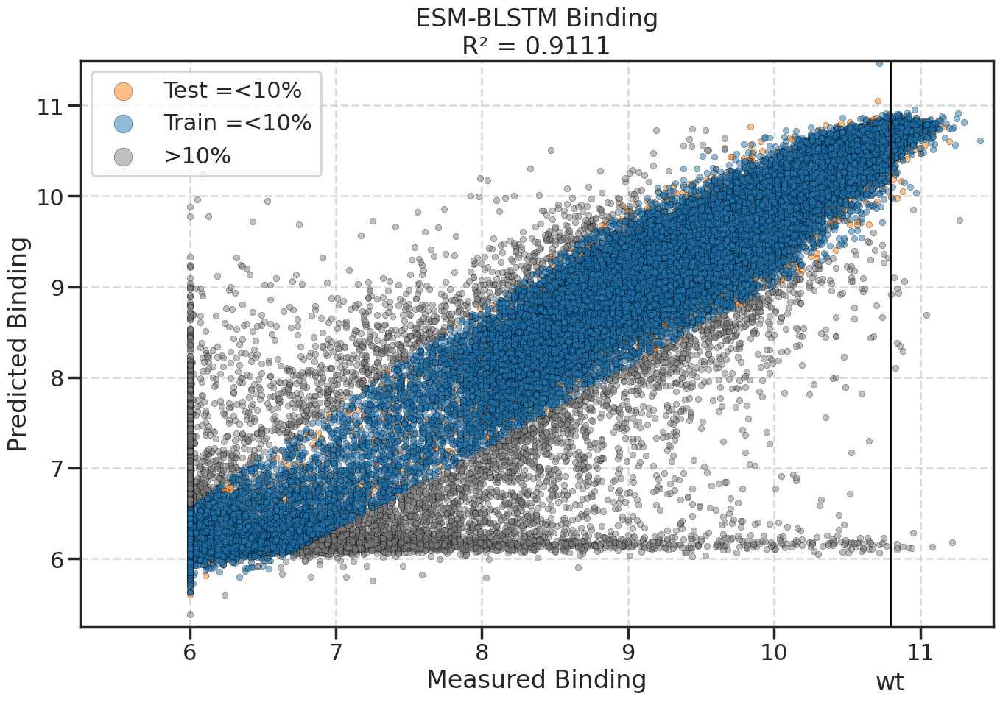

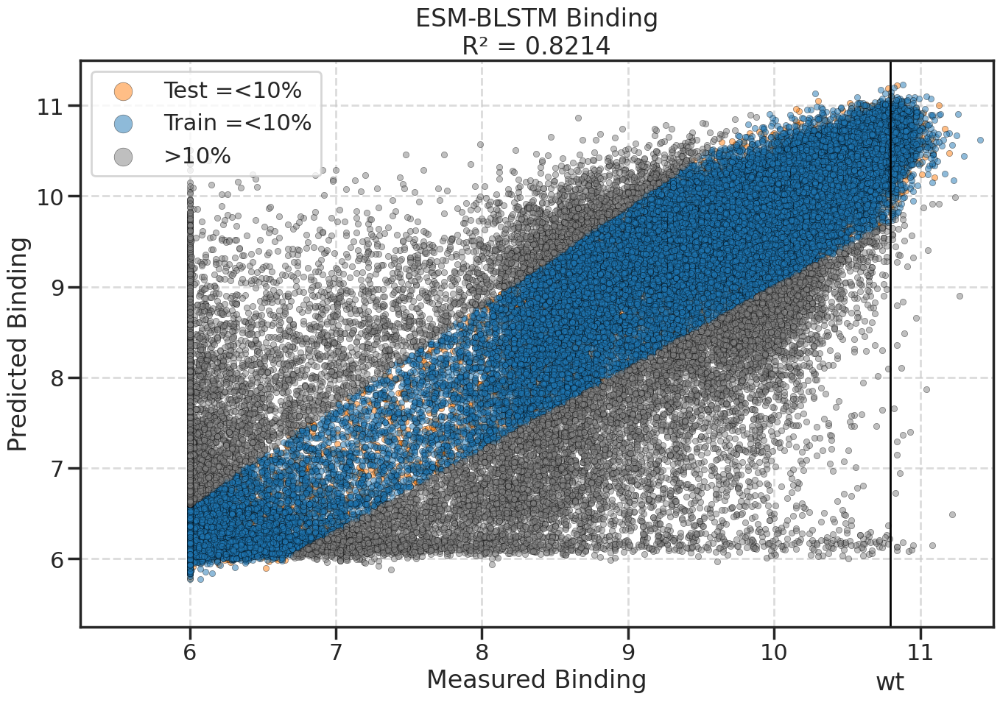

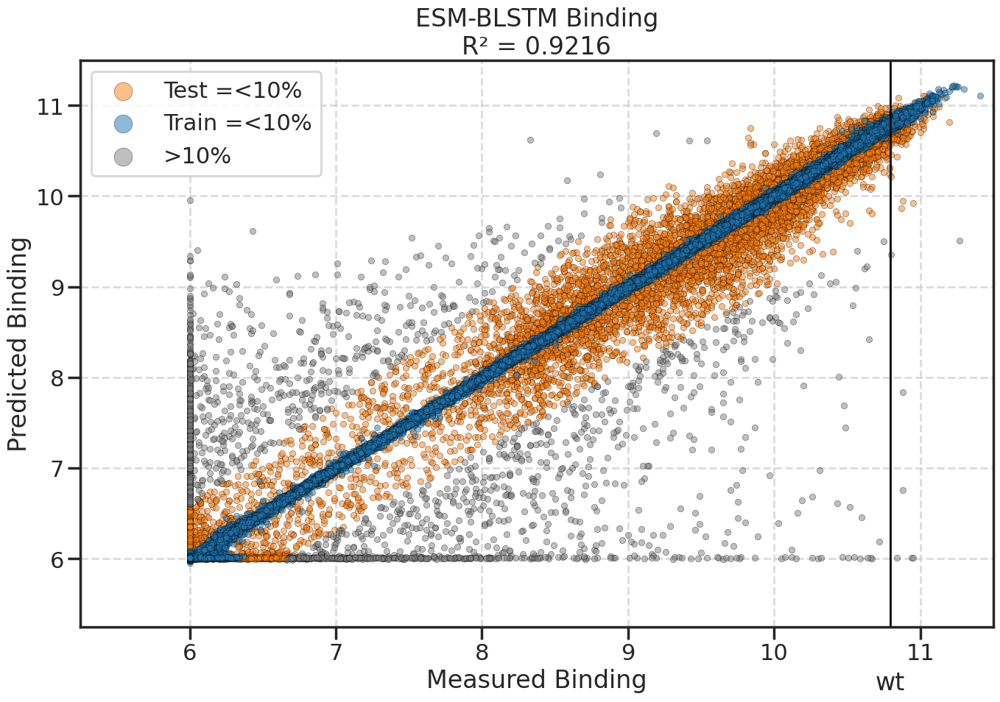

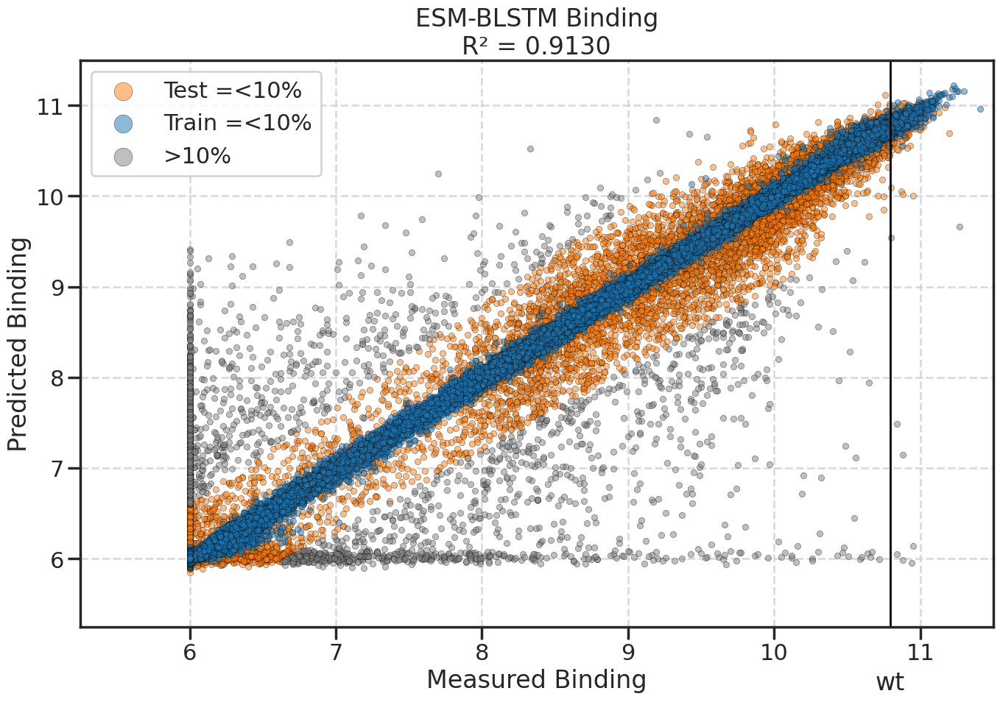

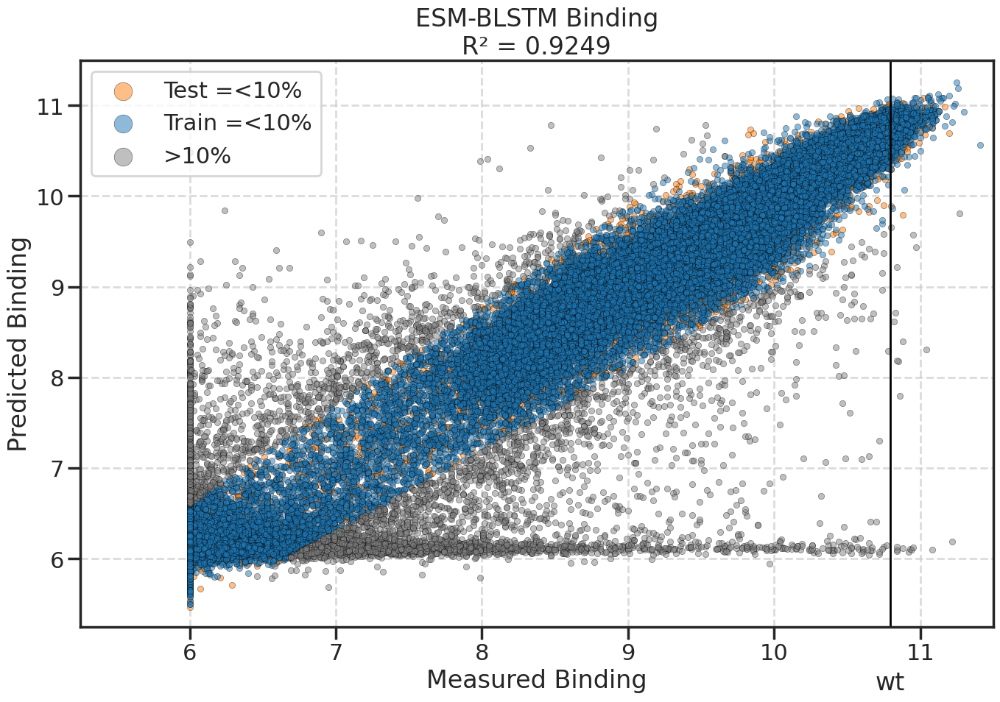

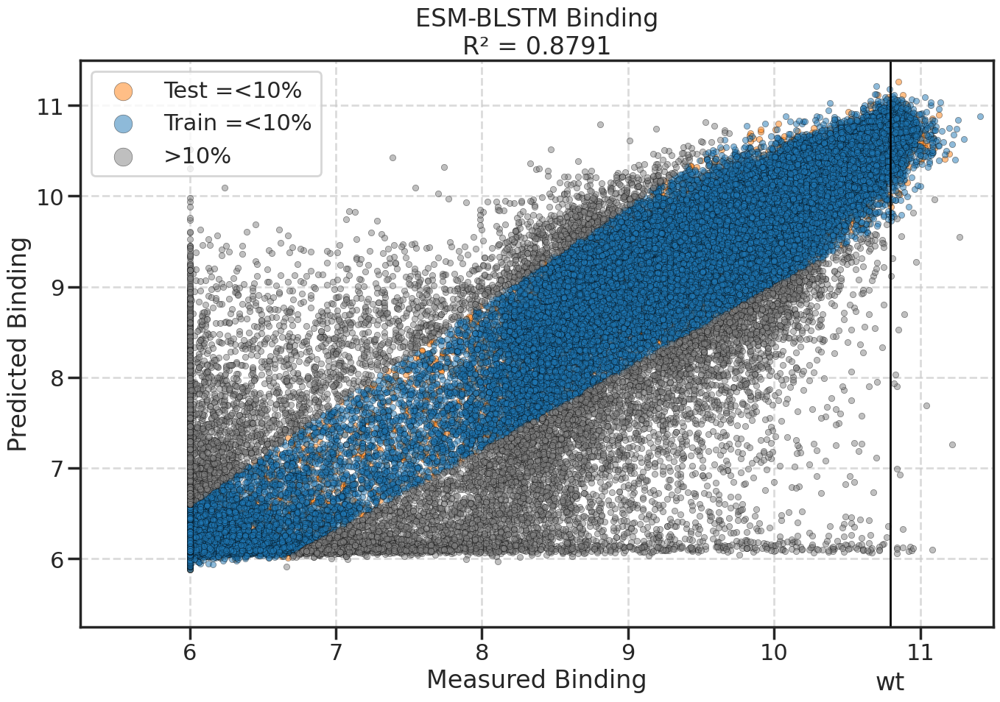

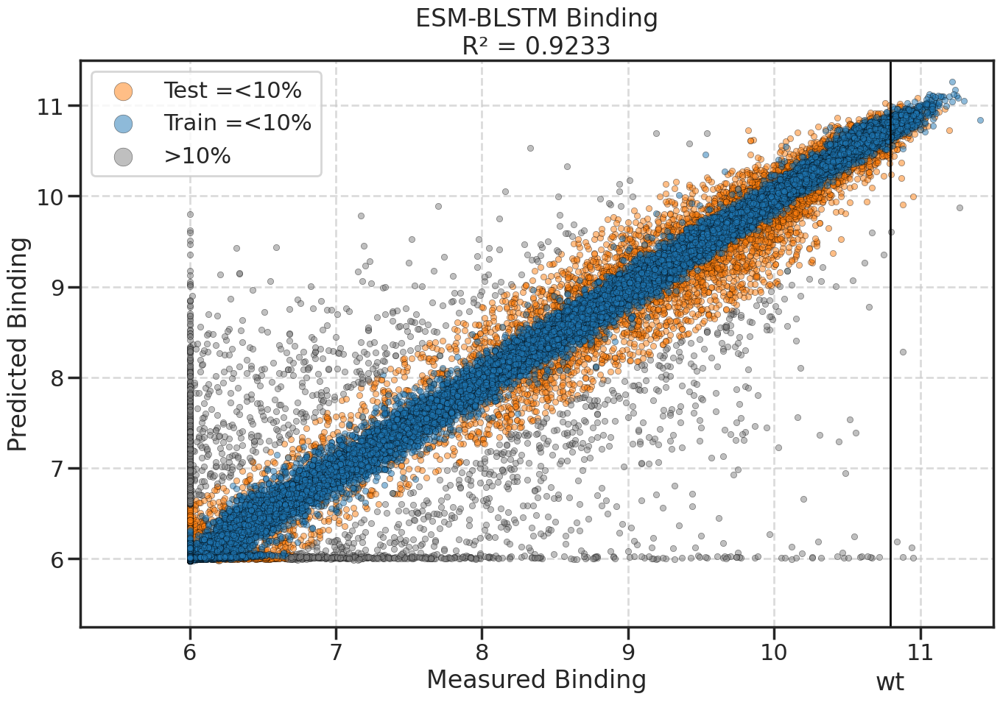

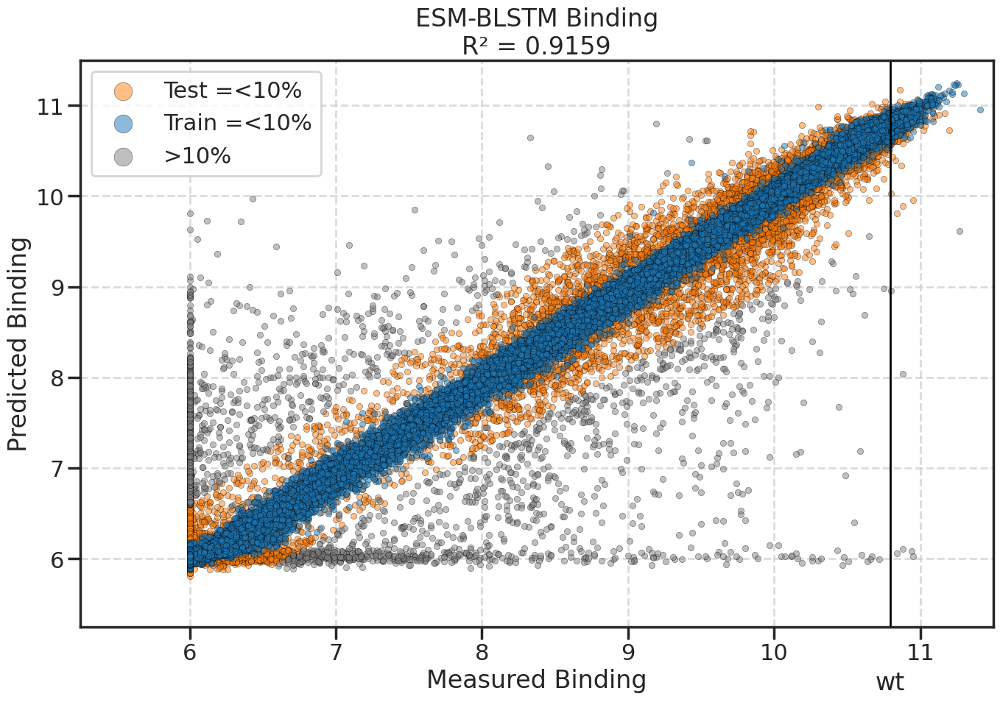

In [3]:
# Binding
df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_blstm/esm_blstm.A.binding-predicted_vs_measured.values.csv")
esm_blstm_a_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-BLSTM Binding", "scatter/esm_blstm/esm_blstm.A.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_blstm/esm_blstm.B.binding-predicted_vs_measured.values.csv")
esm_blstm_b_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-BLSTM Binding", "scatter/esm_blstm/esm_blstm.B.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_blstm/esm_blstm.C.binding-predicted_vs_measured.values.csv")
esm_blstm_c_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-BLSTM Binding", "scatter/esm_blstm/esm_blstm.C.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_blstm/esm_blstm.D.binding-predicted_vs_measured.values.csv")
esm_blstm_d_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-BLSTM Binding", "scatter/esm_blstm/esm_blstm.D.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_blstm/esm_blstm.E.binding-predicted_vs_measured.values.csv")
esm_blstm_e_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-BLSTM Binding", "scatter/esm_blstm/esm_blstm.E.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_blstm/esm_blstm.F.binding-predicted_vs_measured.values.csv")
esm_blstm_f_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-BLSTM Binding", "scatter/esm_blstm/esm_blstm.F.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_blstm/esm_blstm.G.binding-predicted_vs_measured.values.csv")
esm_blstm_g_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-BLSTM Binding", "scatter/esm_blstm/esm_blstm.G.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_blstm/esm_blstm.H.binding-predicted_vs_measured.values.csv")
esm_blstm_h_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-BLSTM Binding", "scatter/esm_blstm/esm_blstm.H.binding-predicted_vs_measured.scatter", binding_wt)

R^2: 0.877035855809535
R^2 outside of threshold: -0.10888270436584846
R^2 inside of threshold: 0.9145471079737624


R^2: 0.8014032426437034
R^2 outside of threshold: -0.22284520084845538
R^2 inside of threshold: 0.8850261337272195
R^2: 0.8935816152177674
R^2 outside of threshold: -0.27115950434593117
R^2 inside of threshold: 0.9236776092664063
R^2: 0.8945815826229954
R^2 outside of threshold: -0.12199555302935217
R^2 inside of threshold: 0.9245003178900209
R^2: 0.9011826407636426
R^2 outside of threshold: -0.22769839059468944
R^2 inside of threshold: 0.9291310573475686
R^2: 0.8284231141639246
R^2 outside of threshold: 0.05231872092530199
R^2 inside of threshold: 0.8892122840746148
R^2: 0.8982713737901816
R^2 outside of threshold: -0.20506039159017164
R^2 inside of threshold: 0.9256308497923857
R^2: 0.888044702394436
R^2 outside of threshold: -0.08925811767971847
R^2 inside of threshold: 0.9202943213541018


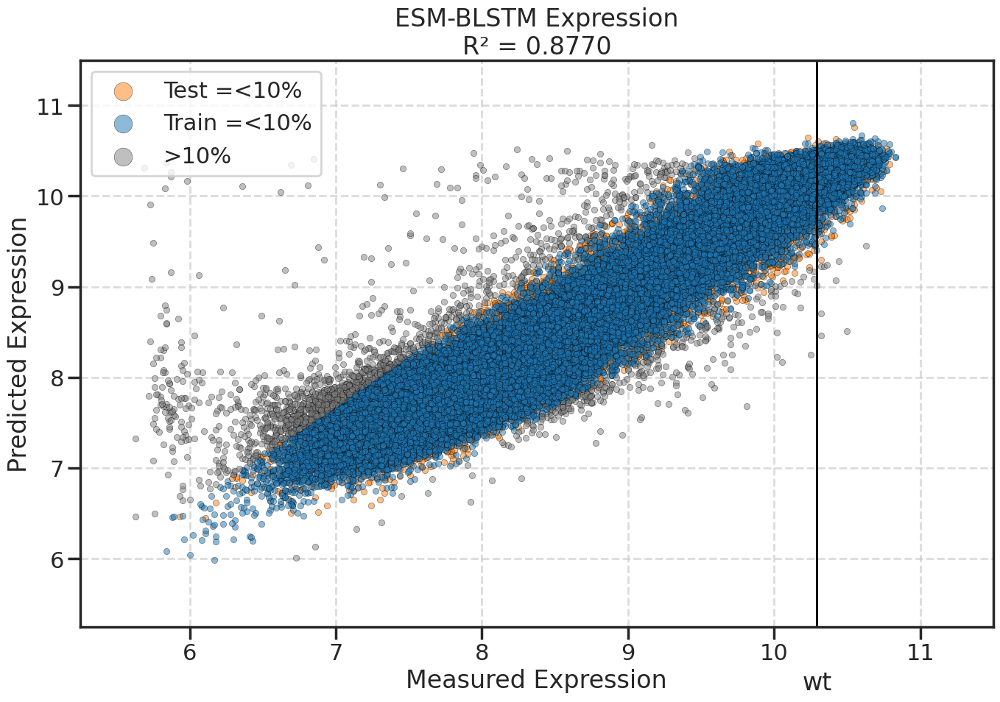

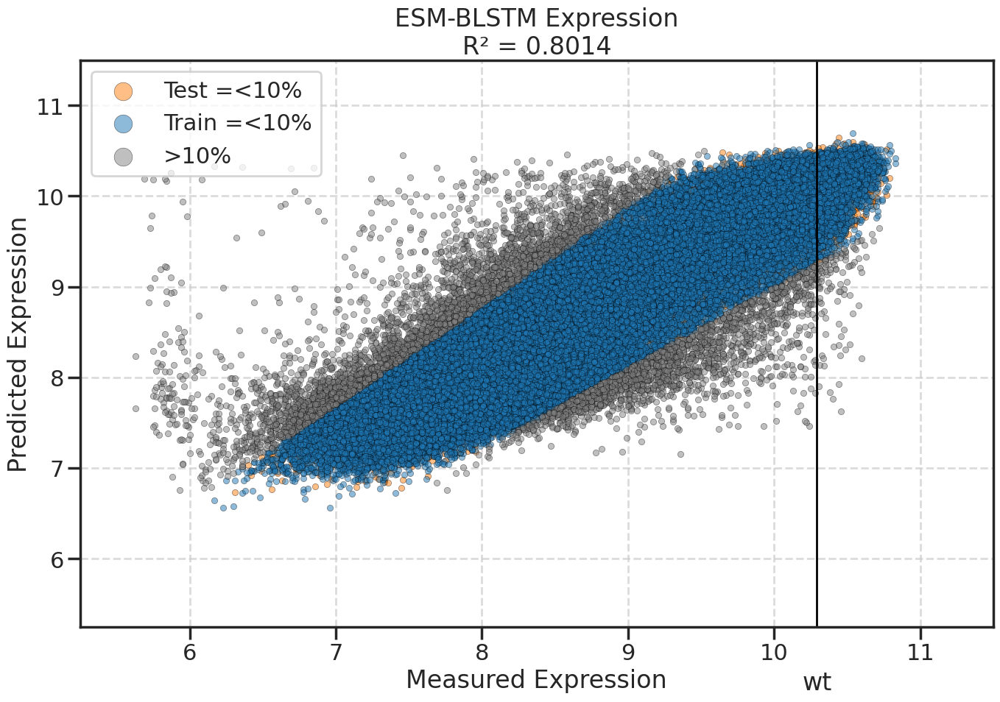

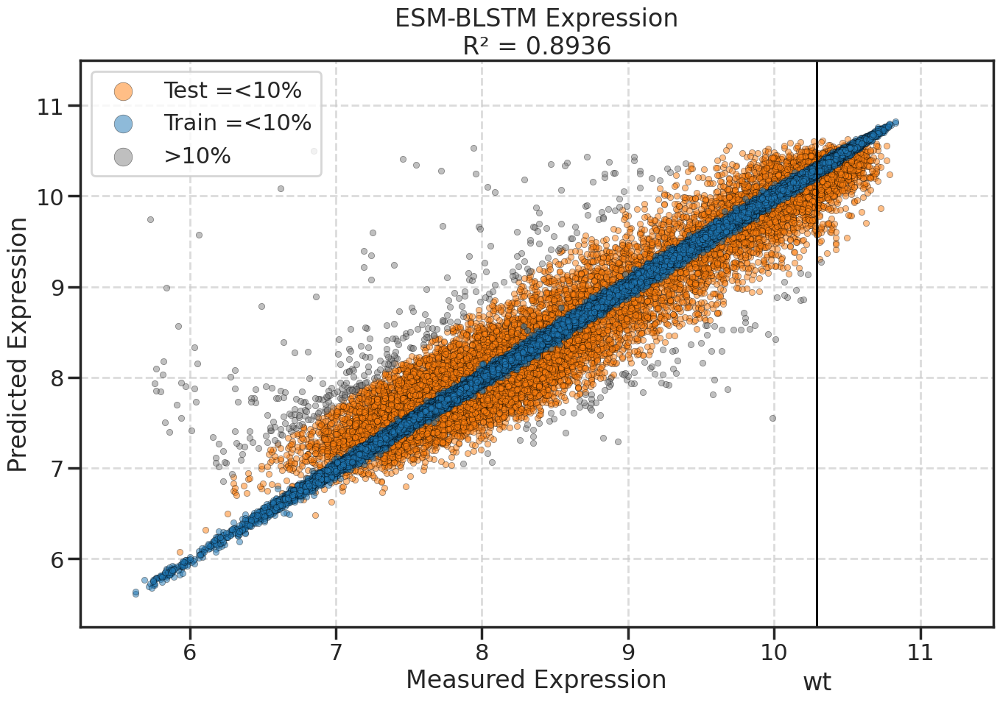

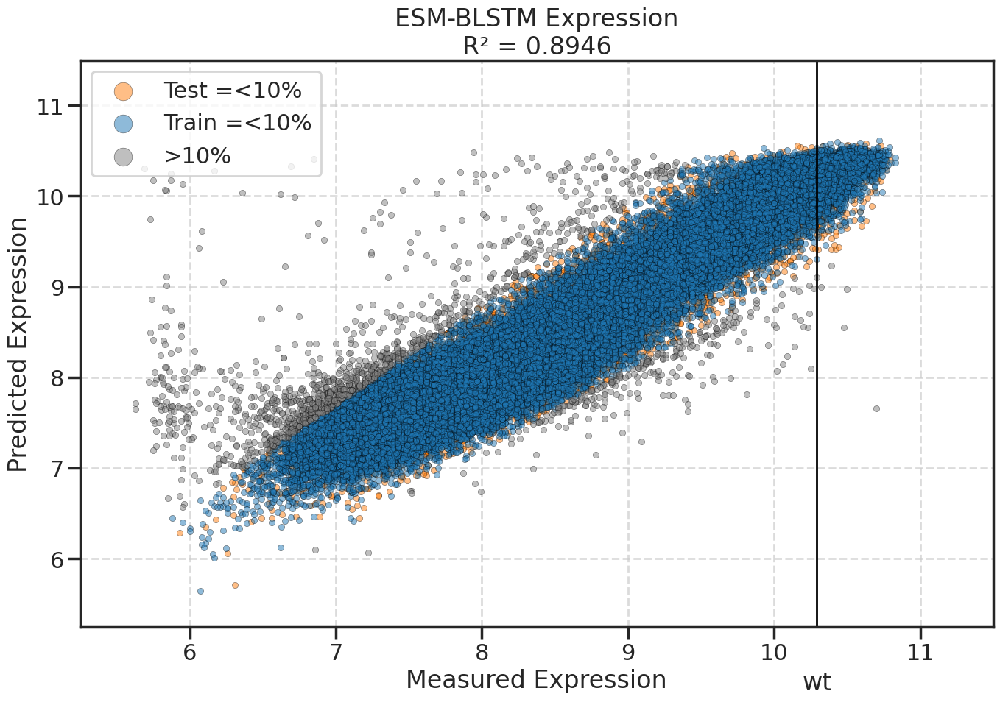

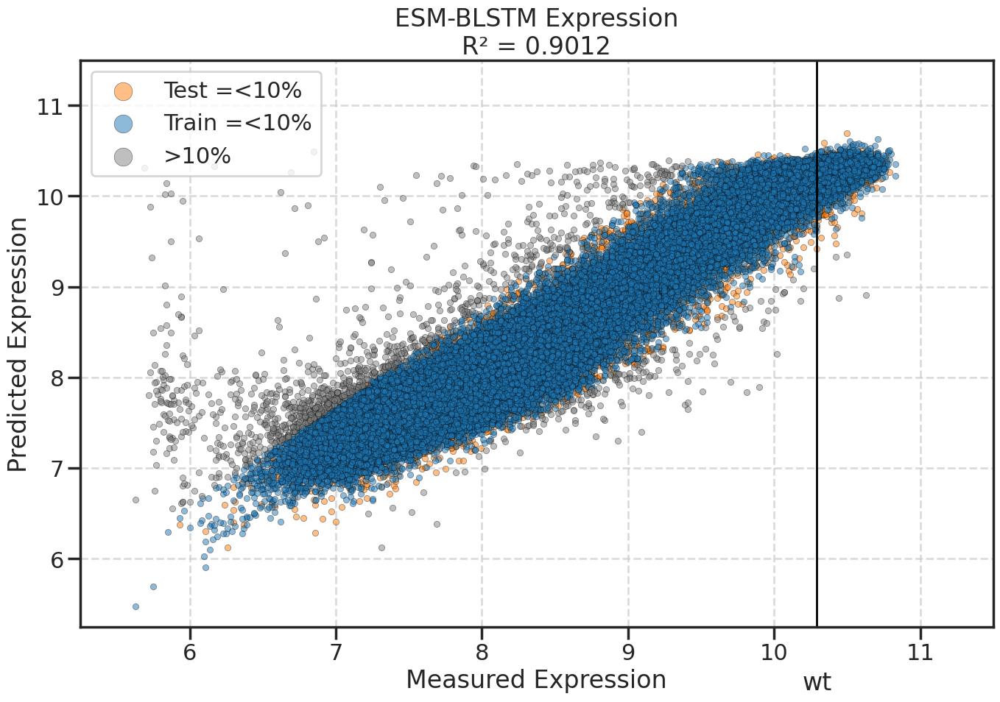

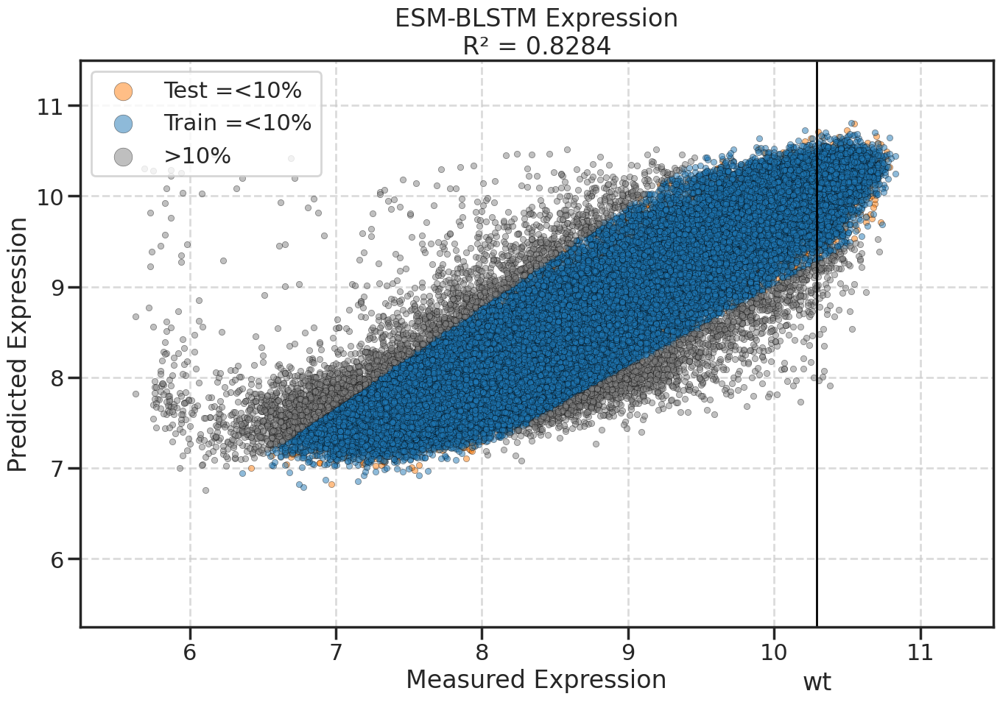

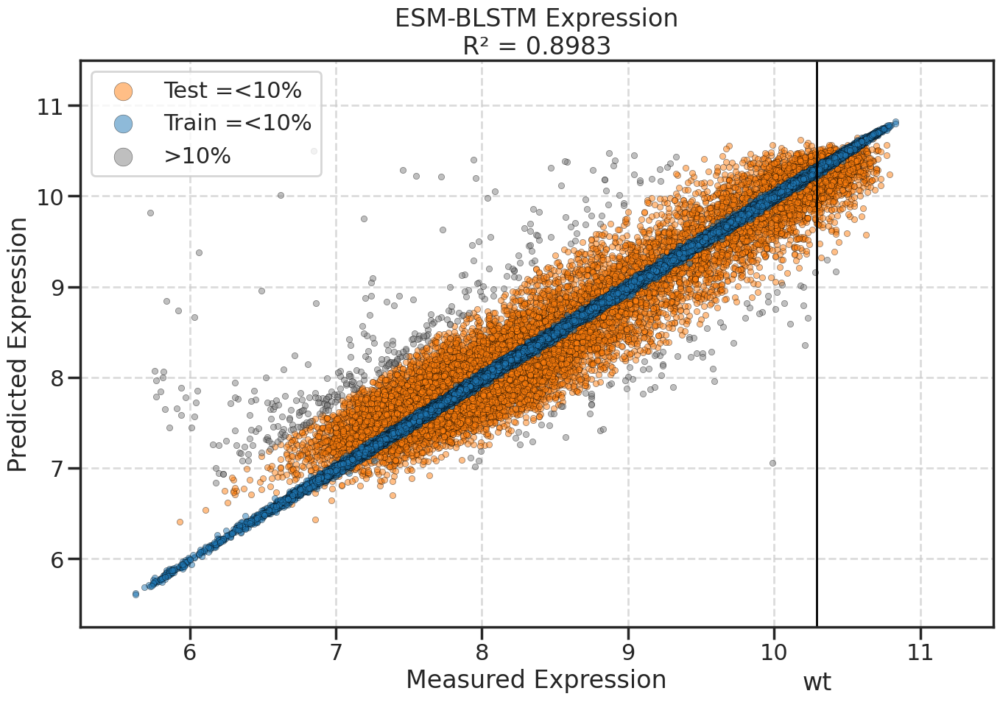

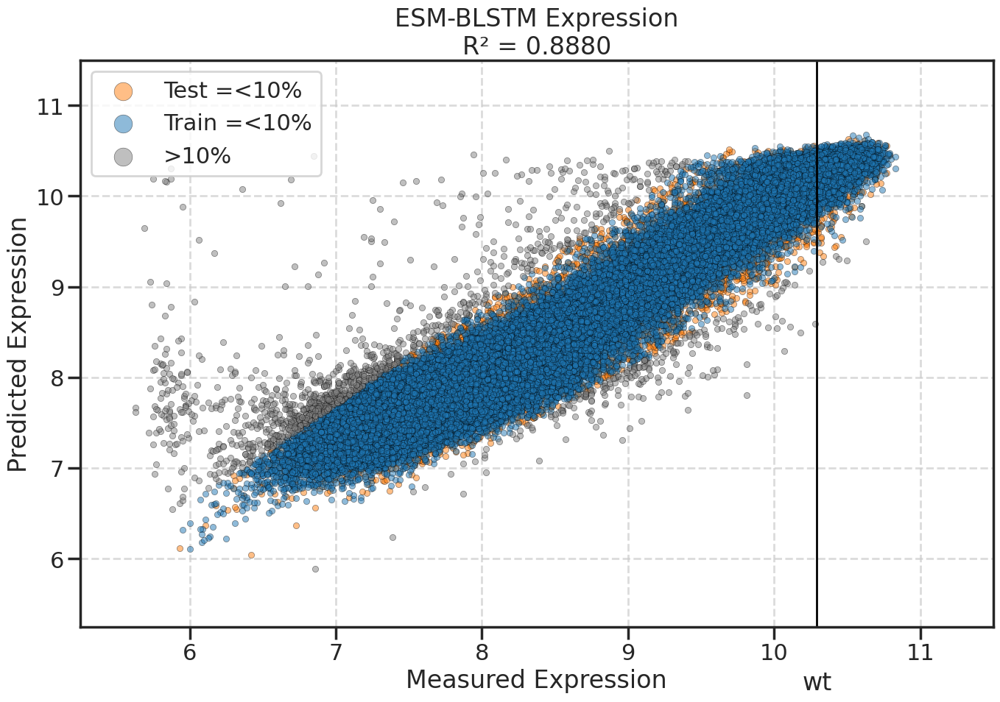

In [4]:
# Expression
df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_blstm/esm_blstm.A.expression-predicted_vs_measured.values.csv")
esm_blstm_a_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-BLSTM Expression", "scatter/esm_blstm/esm_blstm.A.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_blstm/esm_blstm.B.expression-predicted_vs_measured.values.csv")
esm_blstm_b_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-BLSTM Expression", "scatter/esm_blstm/esm_blstm.B.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_blstm/esm_blstm.C.expression-predicted_vs_measured.values.csv")
esm_blstm_c_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-BLSTM Expression", "scatter/esm_blstm/esm_blstm.C.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_blstm/esm_blstm.D.expression-predicted_vs_measured.values.csv")
esm_blstm_d_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-BLSTM Expression", "scatter/esm_blstm/esm_blstm.D.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_blstm/esm_blstm.E.expression-predicted_vs_measured.values.csv")
esm_blstm_e_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-BLSTM Expression", "scatter/esm_blstm/esm_blstm.E.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_blstm/esm_blstm.F.expression-predicted_vs_measured.values.csv")
esm_blstm_f_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-BLSTM Expression", "scatter/esm_blstm/esm_blstm.F.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_blstm/esm_blstm.G.expression-predicted_vs_measured.values.csv")
esm_blstm_g_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-BLSTM Expression", "scatter/esm_blstm/esm_blstm.G.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_blstm/esm_blstm.H.expression-predicted_vs_measured.values.csv")
esm_blstm_h_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-BLSTM Expression", "scatter/esm_blstm/esm_blstm.H.expression-predicted_vs_measured.scatter", expression_wt)

---
### Bar Chart Stats

In [9]:
r2_dict = {
    "A.binding": esm_blstm_a_binding,
    "A.expression": esm_blstm_a_expression,
    "B.binding": esm_blstm_b_binding,
    "B.expression": esm_blstm_b_expression,
    "C.binding": esm_blstm_c_binding,
    "C.expression": esm_blstm_c_expression,
    "D.binding": esm_blstm_d_binding,
    "D.expression": esm_blstm_d_expression,
    "E.binding": esm_blstm_e_binding,
    "E.expression": esm_blstm_e_expression,
    "F.binding": esm_blstm_f_binding,
    "F.expression": esm_blstm_f_expression,
    "G.binding": esm_blstm_g_binding,
    "G.expression": esm_blstm_g_expression,
    "H.binding": esm_blstm_h_binding,
    "H.expression": esm_blstm_h_expression
}
for key, value in r2_dict.items():
    print(f"{key}: {value}")
print("")

# In Millions (M)
params_dict = {
    "A": 2.3,
    "B": 2.3,
    "C": 10.1,
    "D": 10.1,
    "E": 2.3,
    "F": 2.3,
    "G": 10.1,
    "H": 10.1,
}
for key, value in params_dict.items():
    print(f"{key}: {value}")
print("")

runtime_dict = {
    "A.binding": "4:57:59",
    "A.expression": "4:58:43",
    "B.binding": "5:00:28",
    "B.expression": "5:02:12",
    "C.binding": "8:48:20",
    "C.expression": "8:49:44",
    "D.binding": "8:52:22",
    "D.expression": "8:31:11",
    "E.binding": "4:57:46",
    "E.expression": "4:57:03",
    "F.binding": "4:57:44",
    "F.expression": "4:57:03",
    "G.binding": "8:46:57",
    "G.expression": "8:44:59",
    "H.binding": "8:49:15",
    "H.expression": "8:48:25",
}
for key, value in runtime_dict.items():
    print(f"{key}: {value}")
print("")

A.binding: 0.9111441597775383
A.expression: 0.877035855809535
B.binding: 0.8214484587660857
B.expression: 0.8014032426437034
C.binding: 0.92156355672298
C.expression: 0.8935816152177674
D.binding: 0.9129526080988646
D.expression: 0.8945815826229954
E.binding: 0.9249419063003032
E.expression: 0.9011826407636426
F.binding: 0.879058369413313
F.expression: 0.8284231141639246
G.binding: 0.9233147053914923
G.expression: 0.8982713737901816
H.binding: 0.9158758103604825
H.expression: 0.888044702394436

A: 2.3
B: 2.3
C: 10.1
D: 10.1
E: 2.3
F: 2.3
G: 10.1
H: 10.1

A.binding: 4:57:59
A.expression: 4:58:43
B.binding: 5:00:28
B.expression: 5:02:12
C.binding: 8:48:20
C.expression: 8:49:44
D.binding: 8:52:22
D.expression: 8:31:11
E.binding: 4:57:46
E.expression: 4:57:03
F.binding: 4:57:44
F.expression: 4:57:03
G.binding: 8:46:57
G.expression: 8:44:59
H.binding: 8:49:15
H.expression: 8:48:25



---
### Best RMSE Plots (E Binding, E Expression)

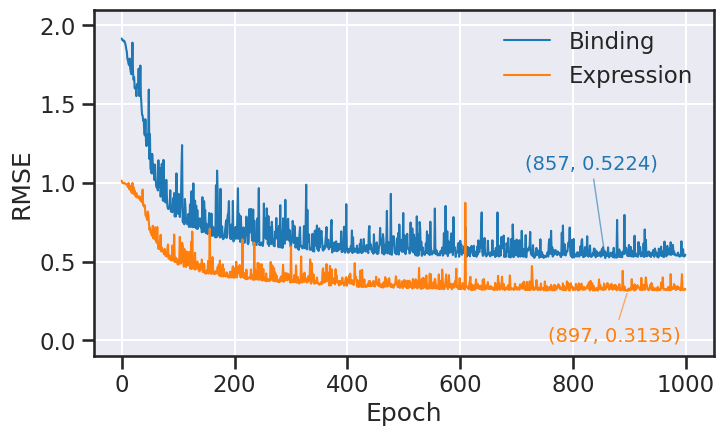

In [6]:
import os 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt

log_dir = "../../src/pnlp/ESM_TL/logs/"
binding_test = os.path.join(log_dir, "esm_blstm/version_21837253/metrics.csv")
expression_test = os.path.join(log_dir, "esm_blstm/version_21837254/metrics.csv")

binding_df = pd.read_csv(
    binding_test, 
    sep=',', 
    header=0,
    usecols=['epoch', 'val_rmse']
)

# Merge rows for each epoch and keep 'epoch' as a column
binding_merged_df = binding_df.groupby("epoch").ffill().bfill().drop_duplicates().reset_index()

# Ensure 'epoch' is correctly named and exists
if "epoch" not in binding_merged_df.columns:
    binding_merged_df.rename(columns={"index": "epoch"}, inplace=True)  # Rename if it was reset incorrectly

# Divide epoch by 2 to correct numbering
binding_merged_df.loc[:, "epoch"] = (binding_merged_df["epoch"] // 2).astype(int)

# Ensure sorting is correct
binding_merged_df = binding_merged_df.sort_values("epoch").reset_index(drop=True)
binding_best_epoch = binding_merged_df.loc[binding_merged_df['val_rmse'].idxmin()]

expression_df = pd.read_csv(
    expression_test, 
    sep=',', 
    header=0,
    usecols=['epoch', 'val_rmse']
)

# Merge rows for each epoch and keep 'epoch' as a column
expression_merged_df = expression_df.groupby("epoch").ffill().bfill().drop_duplicates().reset_index()

# Ensure 'epoch' is correctly named and exists
if "epoch" not in expression_merged_df.columns:
    expression_merged_df.rename(columns={"index": "epoch"}, inplace=True)  # Rename if it was reset incorrectly

# Divide epoch by 2 to correct numbering
expression_merged_df.loc[:, "epoch"] = (expression_merged_df["epoch"] // 2).astype(int)

# Ensure sorting is correct
expression_merged_df = expression_merged_df.sort_values("epoch").reset_index(drop=True)
expression_best_epoch = expression_merged_df.loc[expression_merged_df['val_rmse'].idxmin()]

# Plot
sns.set_style('ticks')
sns.set_context('talk')
fig, ax = plt.subplots(figsize=(8, 4.5)) 

# Plot RMSE
ax.plot(binding_merged_df['epoch'], binding_merged_df['val_rmse'], label='Binding', color='tab:blue', linewidth=1.5)
ax.plot(expression_merged_df['epoch'], expression_merged_df['val_rmse'], label='Expression', color='tab:orange', linewidth=1.5)
ax.set_xlabel('Epoch')
ax.set_ylim(-50, 1050)
ax.set_ylabel('RMSE')
ax.set_ylim(-0.1, 2.1)
ax.legend(loc='upper right', frameon=False)
plt.grid(axis="y", linestyle="-", alpha=1, color='white')
plt.grid(axis="x", linestyle="-", alpha=1, color='white')
ax.set_facecolor('#EAEAF2') 

ax.annotate(
    f'({int(binding_best_epoch["epoch"])}, {binding_best_epoch["val_rmse"]:.4f})',
    (binding_best_epoch["epoch"], binding_best_epoch["val_rmse"]),
    textcoords="offset points", xytext=(-10, 75), ha='center', va='top', color='tab:blue', fontsize=14,
    arrowprops=dict(arrowstyle="-", color='tab:blue', lw=1, alpha=0.6)
)

ax.annotate(
    f'({int(expression_best_epoch["epoch"])}, {expression_best_epoch["val_rmse"]:.4f})',
    (expression_best_epoch["epoch"], expression_best_epoch["val_rmse"]),
    textcoords="offset points", xytext=(-10, -25), ha='center', va='top', color='tab:orange', fontsize=14,
    arrowprops=dict(arrowstyle="-", color='tab:orange', lw=1, alpha=0.6)
)

# Save the figure to the "figures" subdirectory.
save_path = "rmse/best_esm_blstm-test_metrics"
plt.savefig(f"{save_path}.pdf", format='pdf', dpi=300, bbox_inches='tight')
plt.savefig(f"{save_path}.png", format='png', dpi=300, bbox_inches='tight')